# <u>Customer Segmentation</u>

Customer Segmentation is one of key components of any business. It helps the business in product testing, targeting a specific group and to make other such important decisions. 

The data set refers to clients of a wholesale distributor. It includes the annual spending in monetary units (m.u.) on diverse product categories.

The data has been taken from Kaggle. It has the following features:
   - `Channel` - Horeca (Hotel/Restaurant/Cafe) or Retail channel (Nominal)
   
   - `Region` - Region as Lisnon, Oporto or Other (Nominal)
   
   - `Fresh` - annual spending (m.u.) on fresh products (Continuous)
   
   - `Milk` - annual spending (m.u.) on milk products (Continuous)
   
   - `Grocery` - annual spending (m.u.)on grocery products (Continuous)
   
   - `Frozen` - annual spending (m.u.)on frozen products (Continuous)
   
   - `Detergents_Paper` - annual spending (m.u.) on detergents and paper products (Continuous)
   
   - `Delicassen` - annual spending (m.u.)on and delicatessen products (Continuous);

## In this Assignment
**Step 1**: Understand the dataset

**Step 2**: Exploratory Data Analysis

**Step 3**: Principal Component Analysis

**Step 4**: Kernel Principal Component Analysis

**Step 5**: K-Means Clustering with Elbow Method

**Step 6**: Interactive Cluster Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib 
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')

import seaborn as sns

In [2]:
df = pd.read_csv('Wholesale customers data.csv')
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


In [3]:
# Renaming the column and grouping the categorical features
df = df.rename(columns={'Delicassen': 'Delicatessen'})
df['Channel'] = df['Channel'].map({1: 'HoReCa', 2: 'Retail'})
df['Region'] = df['Region'].map({1: 'Lisbon', 2: 'Porto', 3: 'Other'})
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185


In [4]:
features = df.columns.to_list()       # list of all the features

In [5]:
df.info()                            # data types and null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Channel           440 non-null    object
 1   Region            440 non-null    object
 2   Fresh             440 non-null    int64 
 3   Milk              440 non-null    int64 
 4   Grocery           440 non-null    int64 
 5   Frozen            440 non-null    int64 
 6   Detergents_Paper  440 non-null    int64 
 7   Delicatessen      440 non-null    int64 
dtypes: int64(6), object(2)
memory usage: 27.6+ KB


In [6]:
df.describe()            # statistical information

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,12000.297727,5796.265909,7951.277273,3071.931818,2881.493182,1524.870455
std,12647.328865,7380.377175,9503.162829,4854.673333,4767.854448,2820.105937
min,3.000000,55.000000,3.000000,25.000000,3.000000,3.000000
25%,3127.750000,1533.000000,2153.000000,742.250000,256.750000,408.250000
50%,8504.000000,3627.000000,4755.500000,1526.000000,816.500000,965.500000
75%,16933.750000,7190.250000,10655.750000,3554.250000,3922.000000,1820.250000
max,112151.000000,73498.000000,92780.000000,60869.000000,40827.000000,47943.000000


# EDA
In this section we will see the relationship among different features and also the data distribution within each.

In [7]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReCa,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185


In [8]:
df.Region.value_counts()

Other     316
Lisbon     77
Porto      47
Name: Region, dtype: int64

In [9]:
df.Channel.value_counts()

HoReCa    298
Retail    142
Name: Channel, dtype: int64

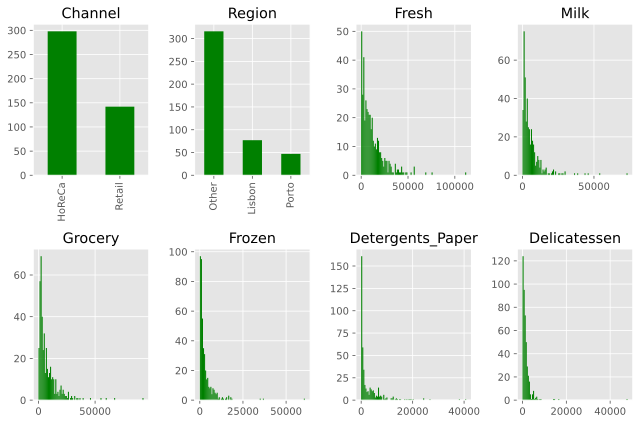

In [10]:
## Visualizing the feature via histplot 

fig, axes = plt.subplots(2, 4, figsize=(9,6))

for feature, ax in zip(features, axes.ravel()):
    if (feature=='Channel') | (feature=='Region'):
        df[feature].value_counts().plot.bar(ax=ax, color='green')
    else:
        ax.hist(df[feature], bins=100, color='green')
    ax.set_title(feature)
plt.tight_layout()   

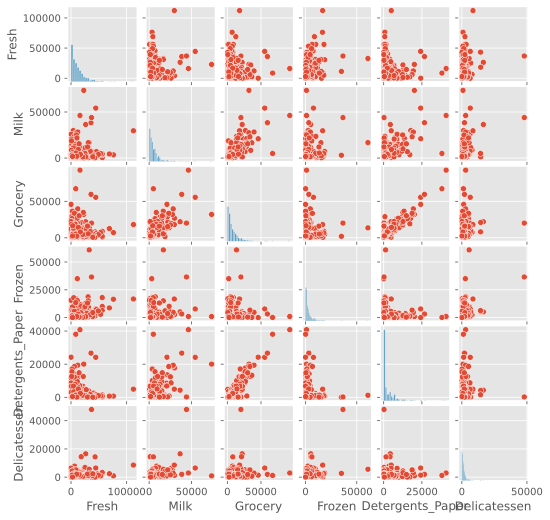

In [11]:
# To visualize the relationship between 2 features
pplot = sns.pairplot(df, vars=features[2:])
pplot.fig.set_size_inches(7,7)

In [12]:
features = ['Fresh','Milk','Grocery','Frozen','Detergents_Paper','Delicatessen']

In [13]:
data = df[features].to_numpy()
data.shape

(440, 6)

**Scaling the data**

In [14]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

scaler = StandardScaler()
data = scaler.fit_transform(data)
data[:, 0].std()

1.0

## PCA

Reducing the dimensionality of the data using Principal Component Analysis. In this section we will see how the performance varies from PCA to Kernel PCA and also among the different kernel types: Poly, Cosine and RBF

In [15]:
pca = PCA(n_components=2)
res_pca = pca.fit_transform(data)

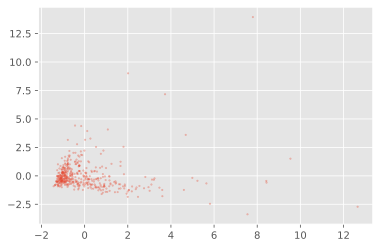

In [16]:
plt.scatter(res_pca[:, 0], res_pca[:, 1], s=3, alpha=0.3)

In [17]:
def scatter(pca):
    fig, axes = plt.subplots(2, 3, figsize=(7, 5))

    for feature, ax in zip(features, axes.ravel()):
        cmap = 'viridis'
        sizes = 20+5*data[:, features.index(feature)]
        cols = df[feature]
        ax.scatter(pca[:, 0], pca[:, 1], s=sizes, c=cols, cmap=cmap)
        ax.set_title(feature)
    plt.tight_layout()

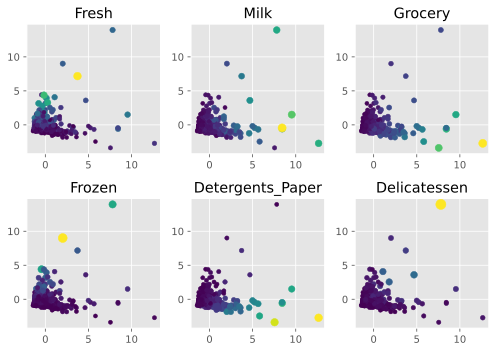

In [18]:
scatter(res_pca)

In [19]:
def cat_scatter(pca):
    fig, axes = plt.subplots(2,1, figsize=(7, 5))

    for feature, ax in zip(['Channel', 'Region'], axes.ravel()):
        cmap = 'Pastel1'
        sizes = 20
        for unique_val in df[feature].unique():
            ax.scatter(pca[df[feature]==unique_val, 0], 
                       pca[df[feature]==unique_val, 1],
                       label = unique_val)

        ax.set_title(feature)
        ax.legend()
    plt.tight_layout()

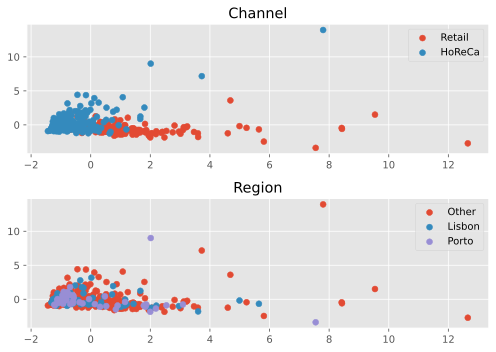

In [20]:
cat_scatter(res_pca)

# Kernel PCA
Let's see whether Kernel PCA performs better

### Poly Function

In [21]:
from sklearn.decomposition import KernelPCA

In [22]:
kpca = KernelPCA(n_components=2, kernel='poly', degree=3)
res_kpca_poly = kpca.fit_transform(data)

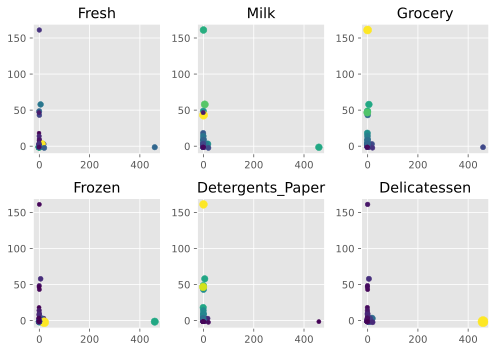

In [23]:
scatter(res_kpca_poly)

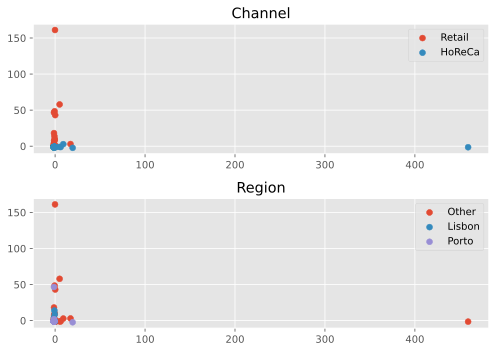

In [24]:
cat_scatter(res_kpca_poly)

### Radial Basis Function

In [25]:
kpca = KernelPCA(n_components=2, kernel='rbf', gamma=0.01)
res_kpca_rbf = kpca.fit_transform(data)

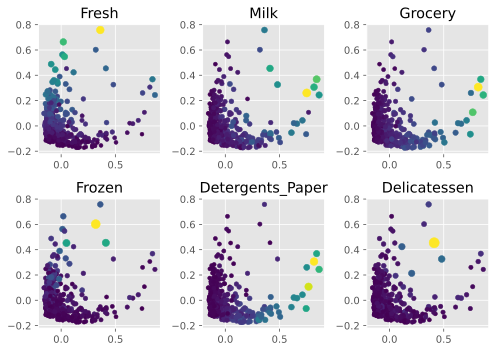

In [26]:
scatter(res_kpca_rbf)

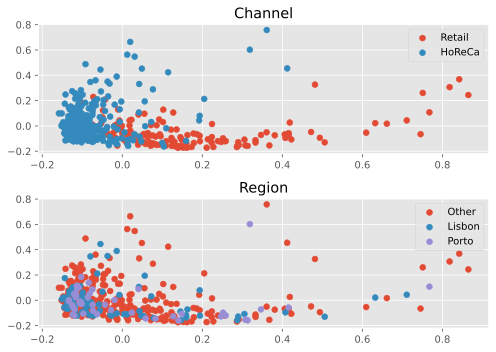

In [27]:
cat_scatter(res_kpca_rbf)

### Cosine Function

In [28]:
kpca = KernelPCA(n_components=2, kernel='cosine')
res_kpca_cos = kpca.fit_transform(data)

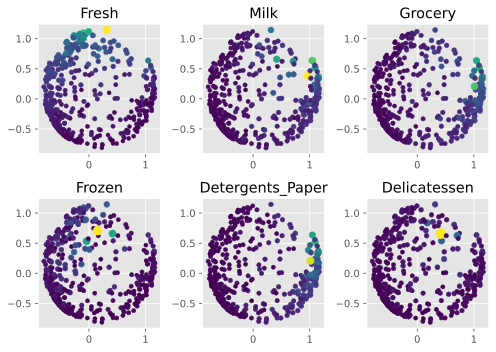

In [29]:
scatter(res_kpca_cos)

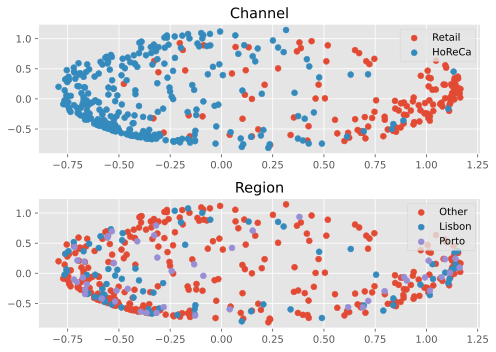

In [30]:
cat_scatter(res_kpca_cos)

In [31]:
# Combining in a single dataframe
df['x_kpca_poly'] = res_kpca_poly[:, 0]
df['y_kpca_poly'] = res_kpca_poly[:, 1]

df['x_kpca_rbf'] = res_kpca_rbf[:, 0]
df['y_kpca_rbf'] = res_kpca_rbf[:, 1]

df['x_kpca_cos'] = res_kpca_cos[:, 0]
df['y_kpca_cos'] = res_kpca_cos[:, 1]

In [32]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos
0,Retail,Other,12669,9656,7561,214,2674,1338,-1.250715,-1.129890,0.019291,-0.043521,0.504789,0.009622
1,Retail,Other,7057,9810,9568,1762,3293,1776,-1.246319,-1.103619,0.051053,-0.072161,0.889941,-0.262833
2,Retail,Other,6353,8808,7684,2405,3516,7844,-0.443468,-1.124730,0.085747,0.005375,0.473994,0.235687
3,HoReCa,Other,13265,1196,4221,6404,507,1788,-1.243229,-1.168208,-0.108671,0.061805,-0.618611,0.370131
4,Retail,Other,22615,5410,7198,3915,1777,5185,-0.977592,-1.156057,-0.010585,0.130396,0.068900,0.861829


# K-Means Algorithm

In [33]:
from sklearn.cluster import KMeans

from yellowbrick.cluster import KElbowVisualizer

In [34]:
features = ['Fresh','Milk','Grocery','Frozen','Detergents_Paper','Delicatessen']

In [35]:
res_kpca = df[['x_kpca_rbf', 'y_kpca_rbf']].to_numpy()

In [36]:
clusterer = KMeans(n_clusters=5)
clusters = clusterer.fit_predict(res_kpca)

In [37]:
markers = list('*hH+xXDd|.,ov^<>12348spP')

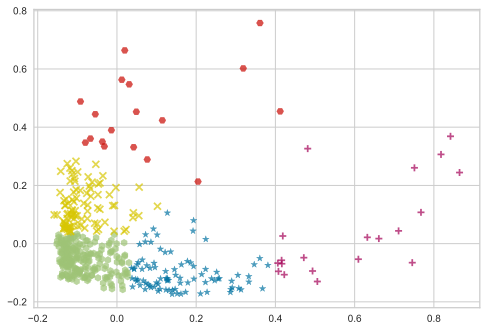

In [38]:
for cluster in np.unique(clusters):
    cluster_data = res_kpca[clusters==cluster]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], alpha=0.7, marker=markers[cluster])

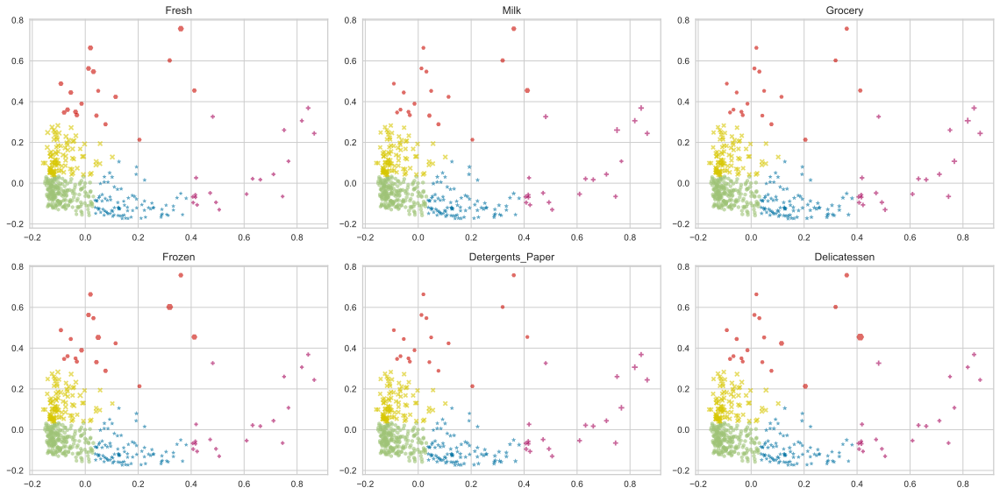

In [39]:
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for feature, ax in zip(features, axes.ravel()):
    cols = 'viridis'
    for cluster in np.unique(clusters):
        sizes = 20+3*data[:, features.index(feature)][clusters==cluster]
        cluster_data = res_kpca[clusters==cluster]
        ax.scatter(cluster_data[:, 0], cluster_data[:, 1], s=sizes, alpha=0.6, cmap=cols, marker=markers[cluster], label=f'Cluster {cluster}')
    ax.set_title(feature)
plt.tight_layout()

## Elbow Method

We will verify our assumption of k=5 using the elbow method

In [40]:
df['cluster_kpca_cos'] = clusters

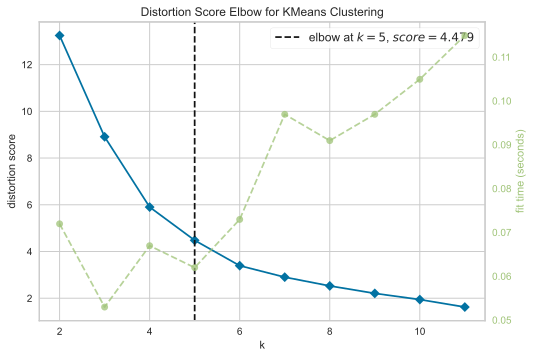

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [41]:
clusterer = KMeans()
visualizer = KElbowVisualizer(clusterer, k=(2, 12), metric='distortion')

visualizer.fit(res_kpca)        
visualizer.show()

In [42]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos,cluster_kpca_cos
0,Retail,Other,12669,9656,7561,214,2674,1338,-1.250715,-1.129890,0.019291,-0.043521,0.504789,0.009622,1
1,Retail,Other,7057,9810,9568,1762,3293,1776,-1.246319,-1.103619,0.051053,-0.072161,0.889941,-0.262833,0
2,Retail,Other,6353,8808,7684,2405,3516,7844,-0.443468,-1.124730,0.085747,0.005375,0.473994,0.235687,0
3,HoReCa,Other,13265,1196,4221,6404,507,1788,-1.243229,-1.168208,-0.108671,0.061805,-0.618611,0.370131,4
4,Retail,Other,22615,5410,7198,3915,1777,5185,-0.977592,-1.156057,-0.010585,0.130396,0.068900,0.861829,4


In [43]:
df.groupby(['cluster_kpca_cos', 'Channel', 'Region'])[features].mean()

Fresh          Milk       Grocery  \
cluster_kpca_cos Channel Region                                             
0                HoReCa  Lisbon   6138.400000  13508.400000  11089.600000   
                         Other    5945.200000  12733.600000  11024.200000   
                 Retail  Lisbon   3114.600000   9248.100000  17184.000000   
                         Other    5814.241379   9139.431034  15181.724138   
                         Porto    3399.363636  10993.636364  16652.636364   
1                HoReCa  Lisbon   6770.918919   2736.351351   2908.675676   
                         Other    6472.772727   2633.863636   3283.734848   
                         Porto    7882.444444   1661.055556   3979.888889   
                 Retail  Lisbon   2665.500000   3632.000000   5677.000000   
                         Other   10496.920000   5472.760000   7584.280000   
                         Porto    9721.000000   3974.750000   7136.250000   
2                HoReCa  Lisbon  46851.250000   4824.500000   4534.000000   
                         Other   48824.230769  10350.923077  10100.153846   
                         Porto   32717.000000  16784.000000  13626.000000   
3                Retail  Lisbon   6317.250000  20614.250000  33618.500000   
                         Other   15041.785714  31030.357143  38100.642857   
                         Porto    9162.000000  15025.500000  42471.500000   
4                HoReCa  Lisbon  22508.615385   3096.692308   4333.615385   
                         Other   23105.278689   3112.344262   3282.377049   
                         Porto   16846.000000   1981.777778   4201.111111   
                 Retail  Lisbon  15927.000000   5955.000000   7413.500000   
                         Other   27759.250000   6459.375000   8949.250000   
                         Porto   21952.500000   3872.500000   6766.500000   

                                       Frozen  Detergents_Paper  Delicatessen  
cluster_kpca_cos Channel Region                                                
0                HoReCa  Lisbon   3497.800000       3103.000000   2299.600000  
                         Other    2671.600000       3924.400000   2532.600000  
                 Retail  Lisbon   1266.600000       7288.100000   1817.900000  
                         Other    1341.120690       6627.327586   1543.413793  
                         Porto    1041.636364       8338.363636   1022.636364  
1                HoReCa  Lisbon   2396.864865        891.945946    666.594595  
                         Other    1702.863636        729.962121    932.598485  
                         Porto    2457.000000        503.777778    818.000000  
                 Retail  Lisbon   4279.000000       3052.000000    740.000000  
                         Other    1217.480000       2865.120000   1075.920000  
                         Porto     907.500000       3280.000000    956.750000  
2                HoReCa  Lisbon   8347.000000        822.000000   2317.000000  
                         Other   14983.692308       1340.384615   7827.153846  
                         Porto   60869.000000       1272.000000   5609.000000  
3                Retail  Lisbon   3802.500000      16386.750000   2586.500000  
                         Other    2181.428571      17792.928571   4007.642857  
                         Porto     629.500000      25255.000000   1420.000000  
4                HoReCa  Lisbon   3457.769231        328.923077   1938.615385  
                         Other    5552.163934        534.229508   1358.016393  
                         Porto    6196.222222        352.888889   1181.333333  
                 Retail  Lisbon   5040.000000       1761.500000   1845.000000  
                         Other    2515.500000       2413.250000   2403.625000  
                         Porto    6462.000000       2221.500000   2812.500000

In [44]:
df.groupby(['cluster_kpca_cos']).count()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos
cluster_kpca_cos,,,,,,,,,,,,,,
0,89,89,89,89,89,89,89,89,89,89,89,89,89,89
1,218,218,218,218,218,218,218,218,218,218,218,218,218,218
2,18,18,18,18,18,18,18,18,18,18,18,18,18,18
3,20,20,20,20,20,20,20,20,20,20,20,20,20,20
4,95,95,95,95,95,95,95,95,95,95,95,95,95,95


In [45]:
clusters = df.cluster_kpca_cos

In [46]:
df_normalized = df.copy(deep=True)
df_normalized.loc[:, features] = data

In [47]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos,cluster_kpca_cos
0,Retail,Other,12669,9656,7561,214,2674,1338,-1.250715,-1.129890,0.019291,-0.043521,0.504789,0.009622,1
1,Retail,Other,7057,9810,9568,1762,3293,1776,-1.246319,-1.103619,0.051053,-0.072161,0.889941,-0.262833,0
2,Retail,Other,6353,8808,7684,2405,3516,7844,-0.443468,-1.124730,0.085747,0.005375,0.473994,0.235687,0
3,HoReCa,Other,13265,1196,4221,6404,507,1788,-1.243229,-1.168208,-0.108671,0.061805,-0.618611,0.370131,4
4,Retail,Other,22615,5410,7198,3915,1777,5185,-0.977592,-1.156057,-0.010585,0.130396,0.068900,0.861829,4


In [48]:
biggest_cluster = df.groupby(['cluster_kpca_cos']).count().max().max()

## Interactive Cluster Analaysis

In [49]:
import plotly.graph_objects as go

In [50]:
fig = go.Figure()

for cluster in np.unique(clusters):
    
    radii = df_normalized.loc[df_normalized.cluster_kpca_cos==cluster, features].values[0].tolist()
    thetas = features
    
    actual_values = df.loc[df.cluster_kpca_cos==cluster, features].values[0].tolist()
    cluster_size = len(df[df.cluster_kpca_cos==cluster])
#     print(cluster_size)
    fig.add_trace(
        go.Scatterpolar(
            r=radii + radii[:1],
            theta=thetas + thetas[:1],
            mode='lines',
            name=f'Cluster {cluster}',
            text = [f'Mean value: {x}' for x in actual_values + actual_values[:1]],
            line=dict(width=3),
            opacity=np.max([cluster_size/biggest_cluster, 0.6])
        )
    )

fig.update_layout(
    title='Cluster Analysis',
    showlegend=True,
    template='plotly_dark',
    width=800,
    autosize=False
)

fig.show()

# Conclusions:
We see that the k value of 5 yeilded the optimal solution and was also verified the elbow method. The 5 different clusters of customers with different preferences. We see that customers of cluster 0 behaves identically with customers of cluster 1. The business can focus on the customers of cluster 0 to increase their volume and expand the business.

## Next Steps:
   We can try other clustering algorithms like DBScan and Hierarchical clustering and compare the results.

Data Scource: https://www.kaggle.com/sahistapatel96/wholesale-customer-datacsv